In [1]:
!python -m pip install xgboost

In [68]:
import pandas as pd
import seaborn
import matplotlib.pyplot as plt
import math
import statsmodels.api as sm

import xgboost as xgb


from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, _tree
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

import warnings
warnings.filterwarnings('ignore')

# 1a)

In [3]:
diagnosis_data_path = '../data/diagnosis.data'

In [4]:
diagnosis_df = pd.read_csv(diagnosis_data_path, encoding='UTF_16', sep='\s+', header=None, decimal=',')

diagnosis_df.columns = ['a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'd1', 'd2']

diagnosis_df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


In [17]:
#prepare data
columns = diagnosis_df.columns

for col in columns:
    diagnosis_df.loc[diagnosis_df[col] == 'no', col] = 0
    diagnosis_df.loc[diagnosis_df[col] == 'yes', col] = 1
    
    
diagnosis_df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


# 1b)

In [18]:
trainX = diagnosis_df.iloc[:, :6]
trainY1 = diagnosis_df.iloc[:, 6:7]
trainY2 = diagnosis_df.iloc[:, 7:]

trainY1 = trainY1.astype('int')
trainY2 = trainY2.astype('int')

|--- feature_3 <= 0.50
|   |--- class: 0
|--- feature_3 >  0.50
|   |--- feature_4 <= 0.50
|   |   |--- feature_0 <= 37.95
|   |   |   |--- class: 1
|   |   |--- feature_0 >  37.95
|   |   |   |--- class: 0
|   |--- feature_4 >  0.50
|   |   |--- class: 1



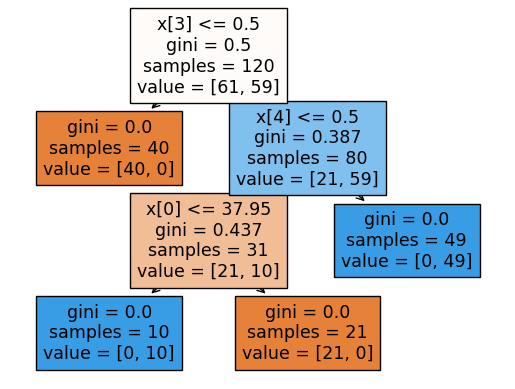

In [19]:
tree_model = DecisionTreeClassifier(random_state = 50)
tree_model.fit(trainX, trainY1)

text_representation = tree.export_text(tree_model)
print(text_representation)

_ = tree.plot_tree(tree_model, filled=True)

|--- feature_0 <= 37.95
|   |--- class: 0
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- class: 1



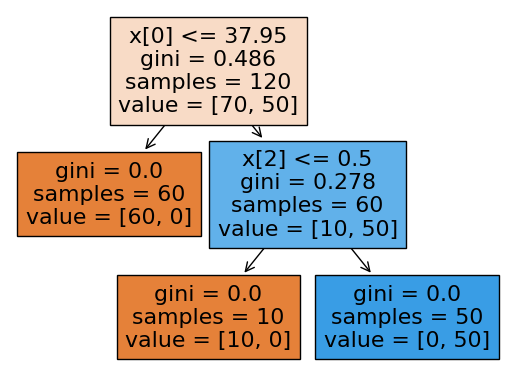

In [20]:
tree_model = DecisionTreeClassifier(random_state = 50)
tree_model.fit(trainX, trainY2)

text_representation = tree.export_text(tree_model)
print(text_representation)

_ = tree.plot_tree(tree_model, filled=True)

|--- feature_0 <= 37.95
|   |--- feature_3 <= 0.50
|   |   |--- class: 0
|   |--- feature_3 >  0.50
|   |   |--- class: 1
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- feature_4 <= 0.50
|   |   |   |--- class: 0
|   |   |--- feature_4 >  0.50
|   |   |   |--- feature_3 <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- feature_3 >  0.50
|   |   |   |   |--- class: 0



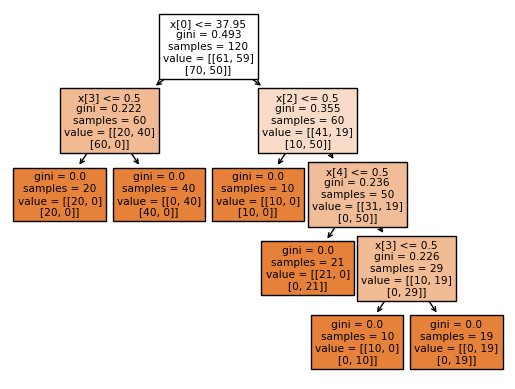

In [21]:
trainY = diagnosis_df.iloc[:, 6:]
trainY = trainY.astype('int')

tree_model = DecisionTreeClassifier(random_state = 50)
tree_model.fit(trainX, trainY)

text_representation = tree.export_text(tree_model)
print(text_representation)

_ = tree.plot_tree(tree_model, filled=True)

# 1c)

In [22]:
def tree_to_code(tree, feature_names):
    tree_ = tree.tree_
    
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    print("def tree({}):".format(", ".join(feature_names)))

    def recurse(node, depth):
        indent = "  " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, threshold))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, threshold))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, tree_.value[node]))

    recurse(0, 1)

In [23]:
tree_to_code(tree_model, diagnosis_df.columns[0:6])

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


# 1d)

In [32]:
max_depth = []

for i in range(0, 11):
    max_depth.append(i)
    
max_depth

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [26]:
ans = []
for i in range(10):
    ans.append((i + 1) / 10)
ans

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

In [35]:
gridSearch = GridSearchCV(DecisionTreeClassifier(random_state=50), {'max_depth': max_depth})
gridSearch.fit(trainX, trainY)

print(gridSearch.best_score_)
print(gridSearch.best_params_)

0.95
{'max_depth': 4}


In [45]:
#get cost-complexity pruning alphas
classifier = DecisionTreeClassifier(random_state=50)
classifier.fit(trainX, trainY)

path = classifier.cost_complexity_pruning_path(trainX, trainY)
alphas = path.ccp_alphas

alphas

array([0.        , 0.04908333, 0.07947222, 0.11111111, 0.20423611])

In [55]:
#Exhaustive search for best alpha
classifier = GridSearchCV(DecisionTreeClassifier(random_state=50), {'ccp_alpha': alphas}, cv=5)
classifier.fit(trainX, trainY)

opt_ccp_alpha = classifier.best_params_['ccp_alpha']

opt_score = classifier.best_score_

print("Best alpha: " + str(opt_ccp_alpha))
print("Best score: " + str(opt_score))

Best alpha: 0.0
Best score: 0.95


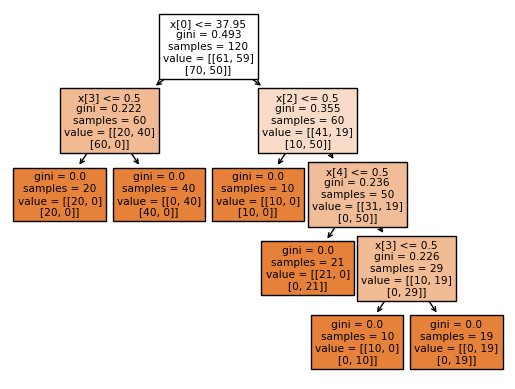

In [58]:
#train a decision tree on best ccp_alpha
dt_classifier = DecisionTreeClassifier(random_state=50, ccp_alpha=opt_ccp_alpha)
dt_classifier.fit(trainX, trainY)

pruned_tree = tree.plot_tree(dt_classifier, filled=True)

In [72]:
train_x, test_x, train_y, test_y = train_test_split(trainX, trainY, test_size=0.20)

y_pred_train = dt_classifier.predict(train_x)
y_pred_test = dt_classifier.predict(test_x)

print("Training Accuracy for best model: " + str(accuracy_score(train_y, y_pred_train)))
print("Test Accuracy for best model: " + str(accuracy_score(test_y, y_pred_test)))

Training Accuracy for best model: 1.0
Test Accuracy for best model: 1.0


In [60]:
tree_to_code(dt_classifier, trainX.columns)

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


# 2a)

In [31]:
communities_data_path = '../data/communities.data'

In [32]:
communities_columns = ['state', 'county', 'community', 'communityname', 'fold', 'population', 'householdsize', 'racepctblack', 'racePctWhite', 'racePctAsian', 'racePctHisp', 'agePct12t21', 'agePct12t29', 'agePct16t24', 'agePct65up', 'numbUrban', 'pctUrban', 'medIncome', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'medFamInc', 'perCapInc', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'NumUnderPov', 'PctPopUnderPov', 'PctLess9thGrade', 'PctNotHSGrad', 'PctBSorMore', 'PctUnemployed', 'PctEmploy', 'PctEmplManu', 'PctEmplProfServ', 'PctOccupManu', 'PctOccupMgmtProf', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'TotalPctDiv', 'PersPerFam', 'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMomYoungKids', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRecent', 'PctImmigRec5', 'PctImmigRec8', 'PctImmigRec10', 'PctRecentImmig', 'PctRecImmig5', 'PctRecImmig8', 'PctRecImmig10', 'PctSpeakEnglOnly', 'PctNotSpeakEnglWell', 'PctLargHouseFam', 'PctLargHouseOccup', 'PersPerOccupHous', 'PersPerOwnOccHous', 'PersPerRentOccHous', 'PctPersOwnOccup', 'PctPersDenseHous', 'PctHousLess3BR', 'MedNumBR', 'HousVacant', 'PctHousOccup', 'PctHousOwnOcc', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt', 'PctHousNoPhone', 'PctWOFullPlumb', 'OwnOccLowQuart', 'OwnOccMedVal', 'OwnOccHiQuart', 'RentLowQ', 'RentMedian', 'RentHighQ', 'MedRent', 'MedRentPctHousInc', 'MedOwnCostPctInc', 'MedOwnCostPctIncNoMtg', 'NumInShelters', 'NumStreet', 'PctForeignBorn', 'PctBornSameState', 'PctSameHouse85', 'PctSameCity85', 'PctSameState85', 'LemasSwornFT', 'LemasSwFTPerPop', 'LemasSwFTFieldOps', 'LemasSwFTFieldPerPop', 'LemasTotalReq', 'LemasTotReqPerPop', 'PolicReqPerOffic', 'PolicPerPop', 'RacialMatchCommPol', 'PctPolicWhite', 'PctPolicBlack', 'PctPolicHisp', 'PctPolicAsian', 'PctPolicMinor', 'OfficAssgnDrugUnits', 'NumKindsDrugsSeiz', 'PolicAveOTWorked', 'LandArea', 'PopDens', 'PctUsePubTrans', 'PolicCars', 'PolicOperBudg', 'LemasPctPolicOnPatr', 'LemasGangUnitDeploy', 'LemasPctOfficDrugUn', 'PolicBudgPerPop', 'ViolentCrimesPerPop' ]



In [34]:
communities_df = pd.read_csv(communities_data_path, header=None, na_values='?')

communities_df.columns = communities_columns

communities_df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [35]:
train_set = communities_df.iloc[:1495, :]
train_set


,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,6,NaN,NaN,Hillsboroughtown,8,0.00,0.59,0.01,0.69,1.00,...,0.02,0.14,0.22,NaN,NaN,NaN,NaN,0.00,NaN,0.03
1491,6,NaN,NaN,Orangecity,8,0.16,0.62,0.03,0.74,0.48,...,0.07,0.40,0.14,0.07,0.05,0.85,0.5,0.61,0.19,0.20
1492,13,NaN,NaN,Waycrosscity,8,0.01,0.36,0.95,0.24,0.03,...,0.03,0.12,0.01,NaN,NaN,NaN,NaN,0.00,NaN,0.30
1493,39,85.0,49056.0,Mentorcity,8,0.06,0.53,0.01,0.98,0.05,...,0.08,0.15,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [36]:
test_set = communities_df.iloc[1495:, :]
test_set

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,6,NaN,NaN,MillValleycity,8,0.00,0.20,0.03,0.91,0.23,...,0.01,0.23,0.73,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1496,48,NaN,NaN,LiveOakcity,8,0.00,0.55,0.13,0.78,0.15,...,0.01,0.18,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.11
1497,35,NaN,NaN,Portalescity,8,0.00,0.52,0.04,0.59,0.05,...,0.01,0.18,0.00,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1498,42,17.0,25112.0,Fallstownship,8,0.04,0.51,0.07,0.92,0.09,...,0.06,0.13,0.16,NaN,NaN,NaN,NaN,0.00,NaN,0.06
1499,51,683.0,48952.0,Manassascity,8,0.03,0.59,0.20,0.75,0.19,...,0.03,0.23,0.06,NaN,NaN,NaN,NaN,0.00,NaN,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


# 2b)

In [37]:
columns_to_impute = communities_df.columns[communities_df.isnull().any()]

columns_to_impute

Index(['county', 'community', 'OtherPerCap', 'LemasSwornFT', 'LemasSwFTPerPop',
       'LemasSwFTFieldOps', 'LemasSwFTFieldPerPop', 'LemasTotalReq',
       'LemasTotReqPerPop', 'PolicReqPerOffic', 'PolicPerPop',
       'RacialMatchCommPol', 'PctPolicWhite', 'PctPolicBlack', 'PctPolicHisp',
       'PctPolicAsian', 'PctPolicMinor', 'OfficAssgnDrugUnits',
       'NumKindsDrugsSeiz', 'PolicAveOTWorked', 'PolicCars', 'PolicOperBudg',
       'LemasPctPolicOnPatr', 'LemasGangUnitDeploy', 'PolicBudgPerPop'],
      dtype='object')

In [38]:
for col in columns_to_impute:
    communities_df[col].fillna(communities_df[col].mean(), inplace=True)

communities_df = communities_df.iloc[:, 5:]

communities_df

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


# 2c)

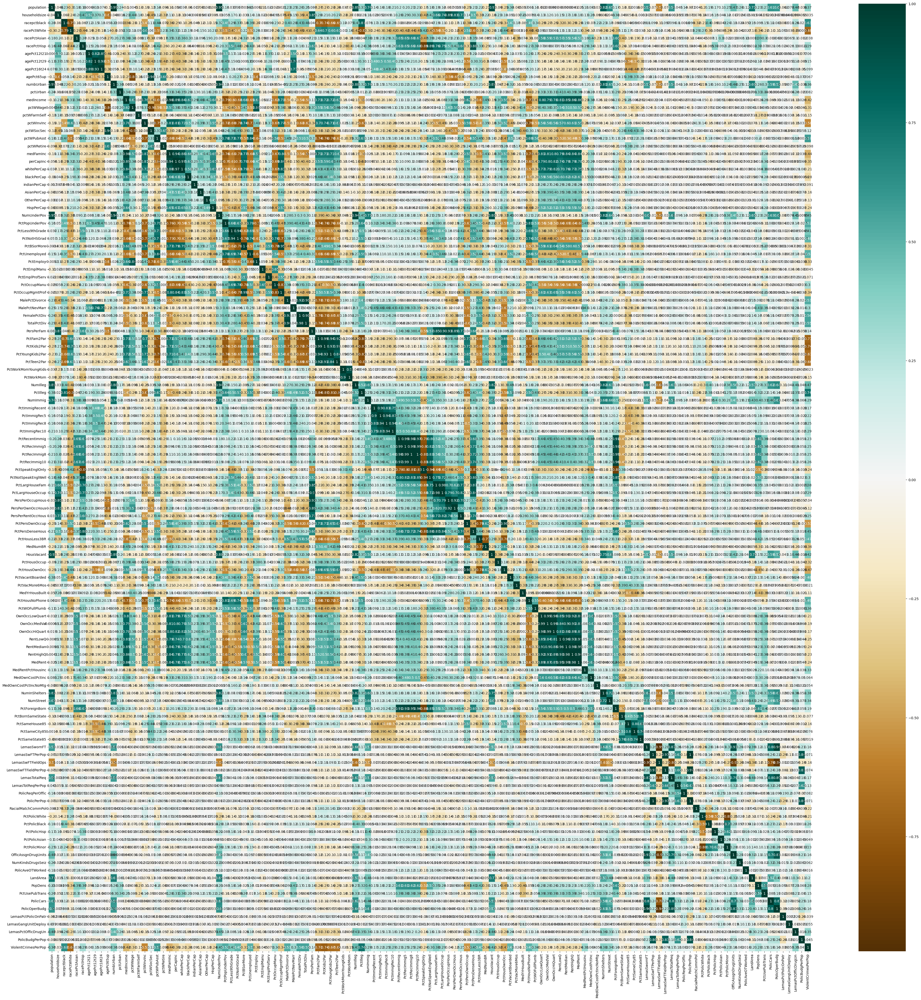

In [39]:
plt.figure(figsize=(50, 50))

seaborn.heatmap(communities_df.corr(), annot=True, cmap='BrBG')

plt.show()

# 2d)

In [40]:
CV = {}

std = communities_df.describe().loc['std']
CV['std'] = std

mean = communities_df.describe().loc['mean']
CV['mean'] = mean

CV['CV'] = std/mean

CV_features = pd.DataFrame.from_dict(CV, orient='index')

CV_features

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
std,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,0.166505,0.179185,...,0.109459,0.203092,0.229055,0.085793,0.056005,0.085459,0.162099,0.240328,0.065796,0.232985
mean,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,0.336264,0.423164,...,0.065231,0.232854,0.161685,0.163103,0.076708,0.698589,0.440439,0.094052,0.195078,0.237979
CV,2.203503,0.353298,1.410920,0.323782,1.359162,1.614278,0.365840,0.290693,0.495161,0.423442,...,1.678031,0.872187,1.416673,0.526001,0.730107,0.122331,0.368040,2.555266,0.337281,0.979015


# 2e)

In [41]:
n_features = int(math.sqrt(128))

top_cv_features = CV_features.loc['CV'].sort_values(ascending=False).head(n_features)

top_cv_features

NumStreet              4.407702
NumInShelters          3.485481
NumIlleg               2.994196
NumImmig               2.900497
LemasPctOfficDrugUn    2.555266
NumUnderPov            2.304970
population             2.203503
numbUrban              2.001744
HousVacant             1.958780
LandArea               1.678031
racePctHisp            1.614278
Name: CV, dtype: float64

SCATTER PLOTS


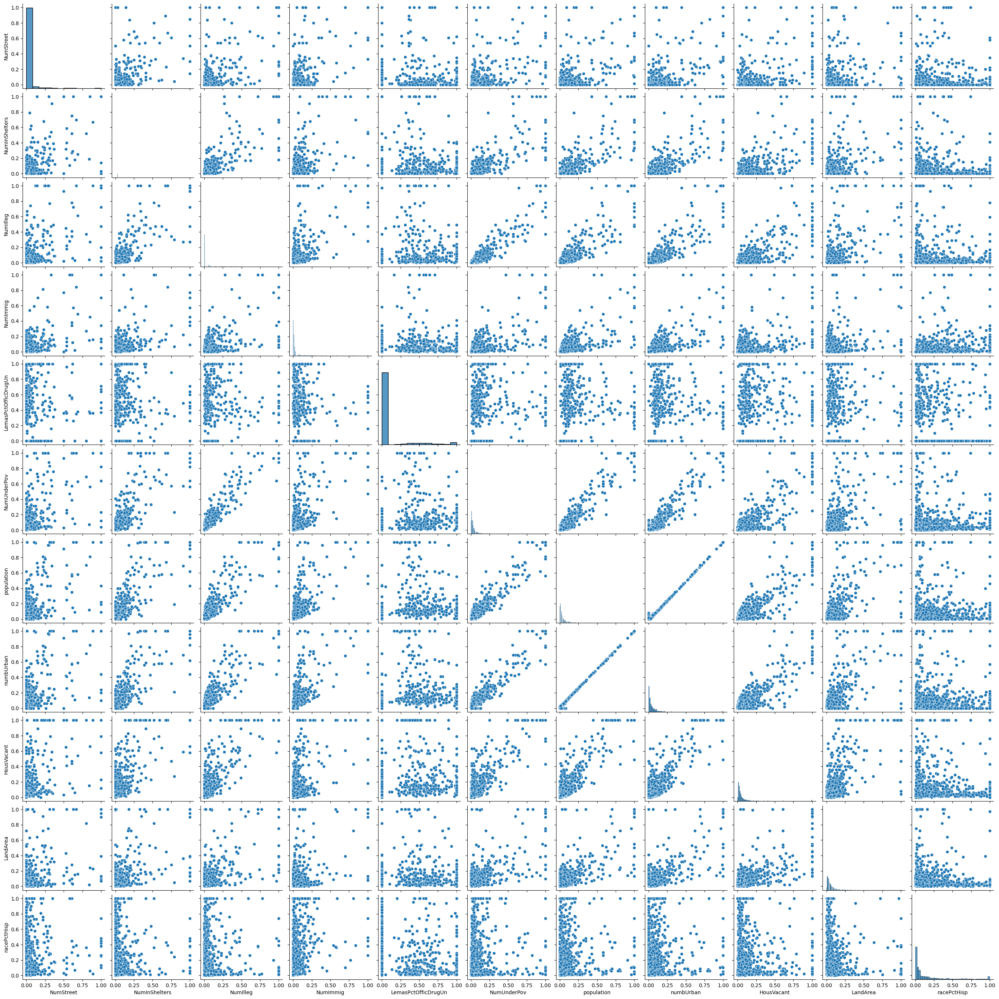

In [22]:
print("SCATTER PLOTS")

seaborn.pairplot(communities_df[top_cv_features.index])

plt.show()

BOX PLOTS


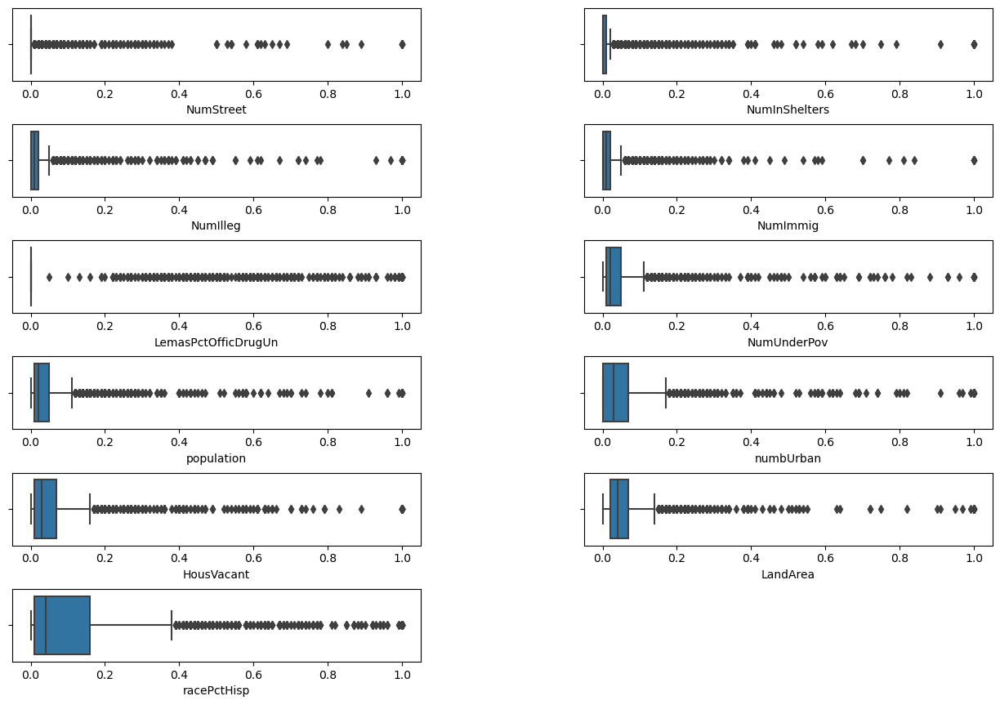

In [42]:
print("BOX PLOTS")

plt.figure(figsize=(15, 10))

i = 0
for col in top_cv_features.index:
    plt.subplot(6, 2, i + 1)
    seaborn.boxplot(x=col, data=communities_df)
    
    i += 1
    
plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.6)

Just from the scatter plots, no conclusion can be drawn about the significance of the top sqrt(128) CV features. 

# 2f) ASK TA

In [43]:
train_df = communities_df.iloc[:1495, :]
train_df

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,0.00,0.59,0.01,0.69,1.00,0.07,0.41,0.28,0.23,0.57,...,0.02,0.14,0.22,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03
1491,0.16,0.62,0.03,0.74,0.48,0.42,0.44,0.57,0.40,0.25,...,0.07,0.40,0.14,0.070000,0.050000,0.850000,0.500000,0.61,0.190000,0.20
1492,0.01,0.36,0.95,0.24,0.03,0.01,0.44,0.42,0.27,0.63,...,0.03,0.12,0.01,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.30
1493,0.06,0.53,0.01,0.98,0.05,0.01,0.40,0.40,0.24,0.29,...,0.08,0.15,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.03


In [44]:
test_df = communities_df.iloc[1495:, :]
test_df

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,0.00,0.20,0.03,0.91,0.23,0.05,0.15,0.19,0.09,0.42,...,0.01,0.23,0.73,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
1496,0.00,0.55,0.13,0.78,0.15,0.36,0.48,0.53,0.30,0.10,...,0.01,0.18,0.02,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.11
1497,0.00,0.52,0.04,0.59,0.05,0.62,0.84,0.78,0.75,0.43,...,0.01,0.18,0.00,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
1498,0.04,0.51,0.07,0.92,0.09,0.03,0.38,0.47,0.27,0.35,...,0.06,0.13,0.16,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.06
1499,0.03,0.59,0.20,0.75,0.19,0.10,0.38,0.62,0.35,0.11,...,0.03,0.23,0.06,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163103,0.076708,0.698589,0.440439,0.00,0.195078,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


In [144]:
trainX = train_df.iloc[:, :-1]
trainY = train_df.iloc[:, -1:]

testX = test_df.iloc[:, :-1]
testY = test_df.iloc[:, -1:]

In [145]:
intercept = sm.add_constant(trainX)
lr_model = sm.OLS(trainY, intercept).fit()

test_intercept = sm.add_constant(testX)
y_pred_test = lr_model.predict(test_intercept)

In [146]:
test_error = mean_squared_error(testY, y_pred_test)

test_error

0.7897255274316061

# 2g)

In [72]:
alphas = []

for i in range(-5, 6):
    alphas.append(10**i)
    
print(alphas)

[1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000]


In [80]:
rr_model = RidgeCV(alphas=alphas, cv=KFold(n_splits=5, random_state=1, shuffle=True))
rr_model.fit(trainX, trainY)

y_pred_test = rr_model.predict(testX)

opt_alpha = rr_model.alpha_

test_error = mean_squared_error(testY, y_pred_test)


print("Ridge Regression")
print("Test Error: " + str(round(test_error, 4) ) )
print("Chosen Alpha: " + str(round(opt_alpha, 4) ) )

Ridge Regression
Test Error: 0.0177
Chosen Alpha: 1.0


# 2h)

In [89]:
lasso_model = LassoCV(alphas=alphas, cv=KFold(n_splits=5, random_state=50, shuffle=True), max_iter=20000)
lasso_model.fit(trainX, trainY)

y_pred_test_lasso = lasso_model.predict(testX)

opt_alpha_lasso = lasso_model.alpha_

test_error_lasso = mean_squared_error(testY, y_pred_test_lasso)

print("Lasso Model ")
print("Test Error: " + str(round(test_error_lasso, 4) ) )
print("Chosen Alpha: " + str(round(opt_alpha_lasso, 4) ) )

Lasso Model 
Test Error: 0.0178
Chosen Alpha: 0.0001


In [90]:
lasso_selected_features = []

for i in range(len(lasso_model.coef_)):
    if lasso_model.coef_[i] != 0:
        lasso_selected_features.append(trainX.columns[i])
        
lasso_selected_features

['racepctblack',
 'racePctAsian',
 'agePct12t21',
 'agePct12t29',
 'agePct65up',
 'pctUrban',
 'pctWWage',
 'pctWFarmSelf',
 'pctWInvInc',
 'pctWSocSec',
 'pctWPubAsst',
 'pctWRetire',
 'whitePerCap',
 'blackPerCap',
 'indianPerCap',
 'AsianPerCap',
 'OtherPerCap',
 'HispPerCap',
 'PctPopUnderPov',
 'PctLess9thGrade',
 'PctBSorMore',
 'PctEmploy',
 'PctEmplManu',
 'PctOccupManu',
 'MalePctDivorce',
 'MalePctNevMarr',
 'FemalePctDiv',
 'PctKids2Par',
 'PctYoungKids2Par',
 'PctTeen2Par',
 'PctWorkMom',
 'NumIlleg',
 'PctIlleg',
 'NumImmig',
 'PctImmigRec10',
 'PctRecImmig10',
 'PctNotSpeakEnglWell',
 'PctLargHouseOccup',
 'PersPerOccupHous',
 'PctPersOwnOccup',
 'PctPersDenseHous',
 'PctHousLess3BR',
 'MedNumBR',
 'HousVacant',
 'PctHousOccup',
 'PctVacantBoarded',
 'PctVacMore6Mos',
 'MedYrHousBuilt',
 'PctHousNoPhone',
 'PctWOFullPlumb',
 'OwnOccLowQuart',
 'RentLowQ',
 'MedRent',
 'MedRentPctHousInc',
 'MedOwnCostPctInc',
 'MedOwnCostPctIncNoMtg',
 'NumInShelters',
 'NumStreet',
 'Pct

Standardized Data

In [87]:
scaler = StandardScaler()

scaled_trainX = scaler.fit_transform(trainX)
scaled_testX = scaler.fit_transform(testX)

lasso_model_scaled = LassoCV(alphas=alphas, cv=KFold(n_splits=5, random_state=50, shuffle=True), max_iter=10000)
lasso_model_scaled.fit(scaled_trainX, trainY)

SCALED_y_pred_test_lasso = lasso_model_scaled.predict(scaled_testX)

SCALED_opt_alpha_lasso = lasso_model_scaled.alpha_

SCALED_test_error_lasso = mean_squared_error(testY, SCALED_y_pred_test_lasso)

print("Lasso Model For Standardized Dataset")
print("Test Error: " + str(round(SCALED_test_error_lasso, 4) ) )
print("Chosen Alpha: " + str(round(SCALED_opt_alpha_lasso, 4) ) )

Lasso Model For Standardized Dataset
Test Error: 0.018
Chosen Alpha: 0.001


In [95]:
SCALED_lasso_selected_features = []

for i in range(len(lasso_model_scaled.coef_)):
    if lasso_model_scaled.coef_[i] != 0:
        SCALED_lasso_selected_features.append(trainX.columns[i])
        
SCALED_lasso_selected_features

['racepctblack',
 'agePct12t21',
 'agePct12t29',
 'pctUrban',
 'pctWWage',
 'pctWFarmSelf',
 'pctWInvInc',
 'pctWSocSec',
 'pctWPubAsst',
 'pctWRetire',
 'whitePerCap',
 'blackPerCap',
 'indianPerCap',
 'AsianPerCap',
 'OtherPerCap',
 'HispPerCap',
 'PctPopUnderPov',
 'PctLess9thGrade',
 'PctEmploy',
 'PctEmplManu',
 'MalePctDivorce',
 'MalePctNevMarr',
 'FemalePctDiv',
 'PctKids2Par',
 'PctYoungKids2Par',
 'PctTeen2Par',
 'PctWorkMom',
 'NumIlleg',
 'PctIlleg',
 'NumImmig',
 'PctImmigRec5',
 'PctRecImmig10',
 'PctNotSpeakEnglWell',
 'PctLargHouseOccup',
 'PctPersOwnOccup',
 'PctPersDenseHous',
 'PctHousLess3BR',
 'HousVacant',
 'PctHousOccup',
 'PctVacantBoarded',
 'PctVacMore6Mos',
 'MedYrHousBuilt',
 'PctWOFullPlumb',
 'RentLowQ',
 'MedRent',
 'MedRentPctHousInc',
 'MedOwnCostPctInc',
 'MedOwnCostPctIncNoMtg',
 'NumInShelters',
 'NumStreet',
 'PctForeignBorn',
 'PctSameCity85',
 'LemasSwFTFieldPerPop',
 'LemasTotalReq',
 'PolicReqPerOffic',
 'RacialMatchCommPol',
 'PctPolicBlack',
 

Lasso Model for Standardized Features performs slightly worse than normal Lasso Model.

# 2i)

In [116]:
PCA_Dimension_errors = {}
min_pca_vaidation_error = float('inf')
opt_M = -1

for M in range(1, 123):
    
    pca = PCA(n_components = M)
    lr_model = LinearRegression(fit_intercept=True)
    pipeline = make_pipeline(pca, lr_model)

    scores = cross_val_score(pipeline, trainX, trainY, cv=5, n_jobs=-1, scoring="neg_mean_squared_error")
    error = round(sum(abs(scores))/len(scores), 6)
    
    PCA_Dimension_errors['Dimen' + str(M)] = error
    
    if error < min_pca_vaidation_error:
        min_pca_vaidation_error = error
        opt_M = M
    

print("Validation error is minimum for M = " + str(opt_M) + " with its error corresponding to: " + str(min_pca_vaidation_error))

PCA_Dimension_errors

Validation error is minimum for M = 96 with its error corresponding to: 0.019403


{'Dimen1': 0.037894,
 'Dimen2': 0.030622,
 'Dimen3': 0.027553,
 'Dimen4': 0.024286,
 'Dimen5': 0.023088,
 'Dimen6': 0.022648,
 'Dimen7': 0.020145,
 'Dimen8': 0.020118,
 'Dimen9': 0.020036,
 'Dimen10': 0.019972,
 'Dimen11': 0.020011,
 'Dimen12': 0.020051,
 'Dimen13': 0.01993,
 'Dimen14': 0.019968,
 'Dimen15': 0.019999,
 'Dimen16': 0.020006,
 'Dimen17': 0.020033,
 'Dimen18': 0.020116,
 'Dimen19': 0.020181,
 'Dimen20': 0.020257,
 'Dimen21': 0.020285,
 'Dimen22': 0.020223,
 'Dimen23': 0.02005,
 'Dimen24': 0.020014,
 'Dimen25': 0.020037,
 'Dimen26': 0.020076,
 'Dimen27': 0.020046,
 'Dimen28': 0.020038,
 'Dimen29': 0.01995,
 'Dimen30': 0.01987,
 'Dimen31': 0.019876,
 'Dimen32': 0.019946,
 'Dimen33': 0.01997,
 'Dimen34': 0.019929,
 'Dimen35': 0.019962,
 'Dimen36': 0.020029,
 'Dimen37': 0.01995,
 'Dimen38': 0.019903,
 'Dimen39': 0.019922,
 'Dimen40': 0.019888,
 'Dimen41': 0.019959,
 'Dimen42': 0.019973,
 'Dimen43': 0.019854,
 'Dimen44': 0.019821,
 'Dimen45': 0.019797,
 'Dimen46': 0.019806,
 'D

In [129]:
pca = PCA(n_components=opt_M).fit(trainX)

pca_train = pca.transform(trainX)
pca_test = pca.transform(testX)

lr_model = LinearRegression()
lr_model.fit(pca_train, trainY)

y_pred_test_pca = lr_model.predict(pca_test)

print('Test Error for PCA: '+ str(round(mean_squared_error(testY, y_pred_test_pca),5)))

Test Error for PCA: 0.01848


# 2j)


In [138]:
BOOSTING_TREE = {}

min_xgb_validation_error = float('inf')
opt_ALPHA = -1

for alpha in alphas:
    reg_tree_model = xgb.XGBRegressor(objective='reg:squarederror', reg_alpha=alpha, random_state=50)
    
    cv_score = cross_val_score(reg_tree_model, trainX, trainY, cv=KFold(5, shuffle=True,random_state=50), n_jobs=-1, scoring="neg_mean_squared_error")
    
    error = round(sum(abs(cv_score))/len(cv_score), 4)
    
    BOOSTING_TREE['ALPHA-' + str(alpha)] = error
    
    if error < min_xgb_validation_error:
        min_xgb_validation_error = error
        opt_ALPHA = alpha
    
    
print("Optimal regularization term is: " + str(opt_ALPHA) + ' and corresponding validation error is: ' + str(min_xgb_validation_error))
BOOSTING_TREE

Optimal regularization term is: 1 and corresponding validation error is: 0.021


{'ALPHA-1e-05': 0.0234,
 'ALPHA-0.0001': 0.0237,
 'ALPHA-0.001': 0.0228,
 'ALPHA-0.01': 0.0218,
 'ALPHA-0.1': 0.0221,
 'ALPHA-1': 0.021,
 'ALPHA-10': 0.0225,
 'ALPHA-100': 0.0565,
 'ALPHA-1000': 0.0565,
 'ALPHA-10000': 0.0565,
 'ALPHA-100000': 0.0565}

In [143]:
reg_tree_model = xgb.XGBRegressor(objective='reg:squarederror', reg_alpha=opt_ALPHA, random_state=50)

reg_tree_model.fit(trainX, trainY)

y_pred_test = reg_tree_model.predict(testX)

print("Test error for xgb tree is: " + str(round(mean_squared_error(testY, y_pred_test), 4)))

Test error for xgb tree is: 0.0178


# References

https://stackoverflow.com/questions/20224526/how-to-extract-the-decision-rules-from-scikit-learn-decision-tree